# Pandoro Gate Exposed: Sedding Light on Sentiments

## This project is managed by a team consisting of the following members:
- **Joshua Brauner** - 778931 - joshua.brauner@studenti.luiss.it
- **Paoloemilio Grande** (Group referent) - 788661 - paoloemilio.grande@studenti.luiss.it
- **Simone Luzi** - 782201 - simone.luzi@studenti.luiss.it


In [4]:
#Importing dependencies
import pandas as pd
import numpy as np
import plotly.graph_objects as go

In [8]:
data_list=["Copertina_Espresso", "Facebook", "Instagram", "Quora", "Reddit","Twitter", "Youtube"]
dataframes=[]
for i in data_list:
    dataframe = pd.read_csv(f"/Users/simone/Desktop/Luiss /*Data science in action/Projects/Deloitte Final Project /Pandoro_Gate_Sentiment_Analysis/data/{i}.csv")
    dataframes.append(dataframe)
    display(dataframe.head(2))

,Username,Text,Title,Date,Source
0,bdadda,Ma vie legali cosa ? 😂😂😂,corriereVerificato(✏️ Maria Volpe) Non è decis...,2024-03-31,Instagram
1,giusy.mardente,Credo che si stia esagerando. Copertina di pes...,corriereVerificato(✏️ Maria Volpe) Non è decis...,2024-03-31,Instagram


,Username,URL,Text,Date,Title,Source
0,Sil Pa,https://www.facebook.com/patrizia.sillano?comm...,I nuovi pupone/Ilary,2024-03-31 00:00:00,Post di affaritaliani.itaffaritaliani.it Accou...,Facebook
1,Lile To,https://www.facebook.com/liliana.torrisi?comme...,"Che storia tossica, che tristezza...",2024-03-31 00:00:00,Post di affaritaliani.itaffaritaliani.it Accou...,Facebook


,Username,Text,Title,URL,Date,Source
0,korwc,"sbagliare è umano, rimediare è esemplare",larepubblicaVerificatoÈ arrivato all’ospedale ...,NaN,2024-01-10,Instagram
1,robertocarrus93,"Almeno lei mantiene la parola , ormai siamo fo...",larepubblicaVerificatoÈ arrivato all’ospedale ...,NaN,2024-01-10,Instagram


,Title,Text,Username,Date,Source
0,[⛔] Caso Ferragni-Balocco È più di un mese che...,👍,Aphex,2024-04-02 00:00:00,Quora
1,[⛔] Caso Ferragni-Balocco È più di un mese che...,"Hanno sbagliato entrambi, ma non più di tanto ...",Gioia Segni,2024-01-15 00:00:00,Quora


,Title,Text,Likes,Username,Post ID,URL,Source,Date,Time
0,Cosa rivela il sondaggio su Chiara Ferragni e ...,NaN,1,AndreaNewsHub,18p2ddp,https://www.today.it/attualita/chiara-ferragni...,Reddit,2023-12-23 00:00:00,10:47:57
1,Bomba sul pandoro-gate: Fedez non sapeva nulla...,NaN,1,AndreaNewsHub,18p6dqm,https://www.today.it/gossip/vip/pandoro-ferrag...,Reddit,2023-12-23 00:00:00,15:06:03


,Text,URL,Date,Source,flag,type_category,post_creator,Title,Username
0,"Chiara Ferragni, è ""fuga"" di brand: anche Pign...",https://twitter.com/fattoquotidiano/status/175...,2024-02-03 00:00:00.000000000,Twitter,news,post,Il Fatto Quotidiano,"Il Fatto Quotidiano: Chiara Ferragni, è ""fuga""...",Il Fatto Quotidiano
1,Bene!!,https://twitter.com/fattoquotidiano/status/175...,2024-02-03 00:00:00.000000000,Twitter,user opinion,comment,Il Fatto Quotidiano,Comment to: 'Il Fatto Quotidiano: Chiara Ferra...,User1860


,Username,URL,Date,Text,Title,Source
0,\n @irisbabilonia\n,https://www.youtube.com/watch?v=sZdxi3t-q8o&lc...,2024-02-05,Vai su https://nordvpn.com/irisbabilonia per o...,CHIARA FERRAGNI E IL PANDORO DELLA VERGOGNA,Youtube
1,@usual.,https://www.youtube.com/watch?v=sZdxi3t-q8o&lc...,2024-02-05,C'è chi aspettava questo video e chi mente,CHIARA FERRAGNI E IL PANDORO DELLA VERGOGNA,Youtube


In [9]:
df=pd.concat(dataframes, ignore_index=True)
df=df[["Source", "Username", "Title", "Text", "Date", "URL", "Post ID","Likes"]]

# EDA

In [11]:
display(df.sample(5))

,Source,Username,Title,Text,Date,URL,Post ID,Likes
50200,Youtube,@cinziacaretto4480,NON C'È PACE PER CHIARA FERRAGNI: IL VIDEO DI ...,Comunque secondo me ha indossato il capo meno ...,2024-01-10,NaN,NaN,NaN
47295,Youtube,@scentofhighclass9576,"Chiara Ferragni: il Pandoro Balocco, le Uova d...",Fake woman .,2024-01-10,NaN,NaN,NaN
32825,Instagram,davgabri,chiaraferragniVerificatoSono sempre stata conv...,Undicesimo comandamento: perdona il tuo influe...,2024-01-10,https://www.instagram.com/chiaraferragni/,NaN,NaN
5253,Facebook,Mary Angela,"""Ferragni spa, il lato oscuro di Chiara"". Ques...",Ilaria D'Ercole,2024-03-10,NaN,NaN,NaN
23217,Instagram,miky.mav,ilsole_24oreVerificatoChiara Ferragni è stata ...,Sta facendo la fine della merda,2024-01-24,NaN,NaN,NaN


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51057 entries, 0 to 51056
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Source    51057 non-null  object 
 1   Username  51057 non-null  object 
 2   Title     50579 non-null  object 
 3   Text      50719 non-null  object 
 4   Date      51057 non-null  object 
 5   URL       14285 non-null  object 
 6   Post ID   5387 non-null   object 
 7   Likes     5387 non-null   float64
dtypes: float64(1), object(7)
memory usage: 3.1+ MB


In [13]:
for i in df.columns:
    print(i, df[i].isnull().sum())

Source 0
Username 0
Title 478
Text 338
Date 0
URL 36772
Post ID 45670
Likes 45670


In [14]:
for i in df.columns:
    print(i, df[i].nunique())

Source 6
Username 38811
Title 321
Text 45136
Date 550
URL 10066
Post ID 4333
Likes 229


In [15]:
#Setting colors to then plot the sources
colours={"Instagram":"#FF2084",
         "Youtube":"#FF0000",
         "Reddit":"#FF3600", 
         "Facebook":"#006EFF",
         "Quora":"#A80000",
         "Twitter":"#08003B"}

In [16]:
source_counts = df['Source'].value_counts()
colors = [colours[source] if source in colours else '#333333' for source in source_counts.index] 

fig = go.Figure(go.Bar(
    x=source_counts.index,
    y=source_counts.values,
    marker_color=colors
))

fig.update_layout(
    title='Data per Source',
    xaxis_title='Source',
    yaxis_title='Count',
    template='plotly_white'
)

fig.show()

# Preprocessing

In [17]:
df=pd.read_csv("Data.csv")

In [18]:
#Missing values in "Text" are relative to emojis not correctly recognized by the scraping algorithm
#Therefore, we will remove them from the dataset
df=df[df["Text"].notnull()]

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50719 entries, 0 to 51056
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Source    50719 non-null  object 
 1   Username  50719 non-null  object 
 2   Title     50241 non-null  object 
 3   Text      50719 non-null  object 
 4   Date      50719 non-null  object 
 5   URL       14154 non-null  object 
 6   Post ID   5279 non-null   object 
 7   Likes     5279 non-null   float64
dtypes: float64(1), object(7)
memory usage: 3.5+ MB


In [19]:
print(df.duplicated().sum(),df.shape)


1084 (50719, 8)


In [20]:
df.drop_duplicates(inplace=True)
df.shape

(49635, 8)

In [5]:
import re
import emoji

In [22]:
#This fuction is to detect and extract emojis from the "Text" column
def detect_emoji(text):
    emoji_set = set()
    
    for character in text:
        if emoji.is_emoji(character):
            emoji_text = emoji.demojize(character, delimiters=("", " "))
            emoji_set.add(emoji_text)
    
    print(list(emoji_set))
    return list(emoji_set)

detect_emoji(df["Text"])

['cross_mark ', 'airplane ', 'END_arrow ', 'face_with_hand_over_mouth ', 'sun ', 'ewe ', 'face_with_crossed-out_eyes ', 'woman_facepalming ', 'crying_face ', 'clown_face ', 'toilet ', 'thumbs_down_medium-light_skin_tone ', 'thumbs_up ', 'face_with_rolling_eyes ', 'drooling_face ', 'heart_suit ', 'sparkling_heart ', 'heart_hands_light_skin_tone ', 'trophy ', 'yawning_face ', 'see-no-evil_monkey ', 'chains ', 'middle_finger_light_skin_tone ', 'grinning_face_with_sweat ', 'face_vomiting ', 'yellow_heart ', 'black_heart ', 'face_with_raised_eyebrow ', 'beaming_face_with_smiling_eyes ', 'zipper-mouth_face ', 'heart_decoration ', 'goat ', 'heart_hands_medium_skin_tone ', 'water_closet ', 'mechanical_arm ', 'nauseated_face ', 'pile_of_poo ', 'folded_hands_medium-light_skin_tone ', 'partying_face ', 'thumbs_down_light_skin_tone ', 'pensive_face ', 'smiling_face ', 'pink_heart ', 'heart_exclamation ', 'blue_heart ', 'woman_facepalming_light_skin_tone ', 'thumbs_down ', 'mending_heart ', 'face_w

['cross_mark ',
 'airplane ',
 'END_arrow ',
 'face_with_hand_over_mouth ',
 'sun ',
 'ewe ',
 'face_with_crossed-out_eyes ',
 'woman_facepalming ',
 'crying_face ',
 'clown_face ',
 'toilet ',
 'thumbs_down_medium-light_skin_tone ',
 'thumbs_up ',
 'face_with_rolling_eyes ',
 'drooling_face ',
 'heart_suit ',
 'sparkling_heart ',
 'heart_hands_light_skin_tone ',
 'trophy ',
 'yawning_face ',
 'see-no-evil_monkey ',
 'chains ',
 'middle_finger_light_skin_tone ',
 'grinning_face_with_sweat ',
 'face_vomiting ',
 'yellow_heart ',
 'black_heart ',
 'face_with_raised_eyebrow ',
 'beaming_face_with_smiling_eyes ',
 'zipper-mouth_face ',
 'heart_decoration ',
 'goat ',
 'heart_hands_medium_skin_tone ',
 'water_closet ',
 'mechanical_arm ',
 'nauseated_face ',
 'pile_of_poo ',
 'folded_hands_medium-light_skin_tone ',
 'partying_face ',
 'thumbs_down_light_skin_tone ',
 'pensive_face ',
 'smiling_face ',
 'pink_heart ',
 'heart_exclamation ',
 'blue_heart ',
 'woman_facepalming_light_skin_tone

In [23]:
#Defining the dictionary for the italian abbreviatons that will be used later
abbreviations_italian = {
    "x": "per",
    "cmq": "comunque",
    "xk": "perché",
    "xké": "perché",
    "xkè": "perché",
    "xke": "perché",
    "xò": "però",
    "xo": "però",
    "ki": "chi",
    "nn": "non",
    "sl": "solo",
    "dv": "dove",
    "qnd": "quando",
    "grz": "grazie",
    "pke": "perché",
    "pké": "perché",
    "pkè": "perché",
    "anke": "anche",
    "qlc": "qualcosa",
    "qlcn": "qualcuno",
    "qlcs": "qualcosa",
    "dvt": "devi",
    "kz": "casa",
    "msg": "messaggio",
    "xche": "perché",
    "tvtb": "ti voglio tanto bene",
    "tvb": "ti voglio bene",
    "sn": "sono",
    "cm": "come",
    "pt": "più tardi",
    "tst": "testo",
    "bll": "bello",
    "brv": "bravo",
    "cos": "cosa",
    "d+": "di più",
    "+": "più",
    "dtt": "detto",
    "fll": "figlio",
    "frt": "forte",
    "ftt": "fatto",
    "grd": "guarda",
    "int": "intanto",
    "mlt": "molto",
    "mntr": "mentre",
    "pnt": "punto",
    "pr": "per",
    "prr": "parere",
    "ps": "posto",
    "pss": "passo",
    "ptt": "purtroppo",
    "qll": "quello",
    "scs": "scusa",
    "spt": "sopratutto",
    "stss": "stesso",
    "vbb": "va bene",
    "vdm": "vediamo",
    "vst": "vestito",
    "xsemp": "per sempre",
    "anke": "anche",
    "ok": "va bene",
    "asl": "età, sesso, località",
    "cmnq": "comunque",
    "nnn": "non",
    "cnn": "con",
    "xqst": "per questo",
    "grz": "grazie",
    "pz": "pezzo",
    "prq": "perché",
    "tnt": "tanto",
    "cmpl": "completo",
    "app": "appena",
    "fz": "faccia",
    "gg": "giorno",
    "slv": "salva",
    "cn": "con",
    "anke": "anche",
    "smp": "sempre",
    "già": "già",
    "gt": "giusto",
    "tnt": "tanto",
    "prpr": "proprio",
    "spt": "sopratutto",
    "nn": "non",
    "tb": "ti bacio",
    "tbr": "ti bacio, ti amo",
    "tlm": "ti lascio un messaggio",
    "ttp": "ti telefono più tardi",
    "xch": "perché",
    "adf": "a domani forse",
    "adp": "a dopo",
    "cmq": "comunque",
    "cn": "con",
    "cs": "cosa",
    "cvd": "ci vediamo dopo",
    "dnq": "dunque",
    "gl": "giocare",
    "mgl": "meglio",
    "np": "nessun problema",
    "omg": "Oh mio Dio",
    "pb": "probabilmente",
    "pq": "perché",
    "psr": "pensare",
    "qls": "qualsiasi",
    "qq": "qualche",
    "stf": "sul fatto",
    "tt": "tutto",
    "tvttb": "ti voglio tanto tanto bene",
    "vb": "va bene",
    "vds": "vedi",
    "wtf": "ma che cavolo",
    "xd": "per dire",
    "xm": "per me",
    "vrmt": "veramente",
    "xsm": "scusami",
    "scs":"scusa",
    "xv": "per voi",
    "anke": "anche",
    "cmplmnt": "complimenti",
    "fv": "favore",
    "xfv": "per favore",
    "perfa": "per favore",
    "llm": "lasciami un messaggio",
    "mnd": "manda",
    "nt": "notte",
    "pls": "per favore",
    "pvt": "privato",
    "qdm": "quando mi",
    "rfl": "riflettere",
    "snt": "sento",
    "tnx": "grazie",
    "ztl": "zona traffico limitato",
    "snc": "se non ci",
    "svt": "salvato",
    "cmpl": "completo",
    "grz": "grazie",
    "mtr": "meglio",
    "nmq": "non mi quitterò",
    "rqd": "richiedo",
    "slm": "salutami",
    "stfm": "sul fatto mio",
    "ztt": "zitto"
}


In [24]:
#Defining a dictionary to detect more emojis than the standard ones, this too will be later applied
emoji_italian = {
    "thumbs_down_medium-light_skin_tone": "emoji pollice verso il basso",
    'middle_finger': "emoji dito medio",
    'partying_face': "faccina festaiola",
    'yawning_face': "faccina che sbadiglia",
    'woman_facepalming': "emoji donna che si prende la testa",
    'heart_hands_light_skin_tone': "emoji mani a cuore",
    'chains': "emoji catene",
    'thumbs_down_medium-dark_skin_tone': "emoji pollice verso il basso",
    'heart_exclamation': "emoji cuore esclamativo",
    'orange_heart': "emoji cuore arancione",
    'rolling_on_the_floor_laughing': "faccina che ride a crepapelle",
    'see-no-evil_monkey': "emoji scimmia che non vede",
    'goat': "emoji capra",
    'flexed_biceps': "emoji bicipite flesso",
    'clapper_board': "emoji ciak",
    'face_holding_back_tears': "faccina che trattiene le lacrime",
    'zipper-mouth_face': "faccina con bocca chiusa da zip",
    'face_vomiting': "faccina che vomita",
    'ewe': "emoji pecora",
    'pensive_face': "faccina pensierosa",
    'mending_heart': "emoji cuore che guarisce",
    'face_with_rolling_eyes': "faccina con occhi al cielo",
    'mechanical_arm': "emoji braccio meccanico",
    'pile_of_poo': "emoji cacca",
    'lying_face': "faccina che mente",
    'cactus': "emoji cactus",
    'face_with_steam_from_nose': "faccina che sbuffa",
    'person_facepalming_light_skin_tone': "emoji persona che si prende la testa",
    'heart_suit': "emoji seme di cuori",
    'face_with_symbols_on_mouth': "faccina arrabbiata che lancia insulti",
    'green_heart': "emoji cuore verde",
    'clown_face': "faccina di clown",
    'sun': "emoji sole",
    'face_with_hand_over_mouth': "faccina con mano sulla bocca",
    'purple_heart': "emoji cuore viola",
    'enraged_face': "faccina infuriata",
    'grinning_face_with_sweat': "faccina sorridente imbarazzata",
    'face_with_tears_of_joy': "faccina che piange dalle risate",
    'middle_finger_light_skin_tone': "emoji dito medio",
    'white_heart': "emoji cuore bianco",
    'pink_heart': "emoji cuore rosa",
    'skull': "emoji teschio",
    'face_with_crossed-out_eyes': "faccina con occhi barrati",
    'cross_mark': "emoji croce di negazione",
    'fire': "emoji fuoco",
    'Italy': "emoji Italia",
    'crying_face': "faccina piangente",
    'woman_white_hair': "emoji donna con capelli bianchi",
    'smiling_face_with_open_hands': "faccina sorridente con mani aperte",
    'face_with_raised_eyebrow': "faccina irritata con sopracciglio alzato",
    'smiling_face_with_hearts': "faccina sorridente con cuori",
    'yellow_heart': "emoji cuore giallo",
    'TOP_arrow': "emoji freccia in alto",
    'thumbs_down': "emoji pollice verso il basso",
    'loudly_crying_face': "faccina che piange forte",
    'brown_heart': "emoji cuore marrone",
    'folded_hands_medium-light_skin_tone': "emoji mani giunte",
    "folded_hands_light_skin_tone":"emoji mani giunte",
    'thumbs_up': "emoji pollice in su",
    'shushing_face': "faccina che fa shh",
    'money-mouth_face': "faccina con bocca a forma di soldi",
    'blue_heart': "emoji cuore blu",
    'nauseated_face': "faccina nauseata",
    'face_savoring_food': "faccina che gusta il cibo",
    'bottle_with_popping_cork': "emoji bottiglia con tappo che salta",
    'heart_hands_medium_skin_tone': "emoji mani a cuore",
    'person_facepalming': "emoji persona che si prende la testa",
    'heart_decoration': "emoji decorazione a cuore",
    'airplane': "emoji aereo",
    'water_closet': "emoji WC",
    'flexed_biceps_medium-light_skin_tone': "emoji bicipite flesso",
    'raising_hands': "emoji mani alzate",
    'smiling_face_with_heart-eyes': "faccina sorridente con occhi a cuore",
    'toilet': "emoji toilette",
    'face_with_open_mouth': "faccina sorpresa con bocca aperta",
    'beaming_face_with_smiling_eyes': "faccina raggiante con occhi sorridenti",
    'airplane_departure': "emoji partenza aereo",
    'black_heart': "emoji cuore nero",
    'circus_tent': "emoji tenda da circo",
    'sparkling_heart': "emoji cuore scintillante",
    'END_arrow': "emoji freccia finale",
    'clapping_hands': "emoji mani che applaudono",
    'smiling_face': "faccina sorridente",
    'broken_heart': "emoji cuore spezzato",
    'folded_hands': "emoji mani giunte",
    'star-struck': "faccina con stelle negli occhi",
    'trophy': "emoji trofeo",
    'woman_facepalming_light_skin_tone': "emoji donna che si prende la testa",
    'red_heart': "emoji cuore rosso",
    "worriedface":"faccina preoccupata",
    "clapping_hands_light_skin_tone": "emoji applauso",
    "clapping_hands_medium-light_skin_tone": "emoji applauso",
    "pinched_fingers_light_skin_tone":"emoji mani che fanno ma che cavolo",
    "heart_with_arrow":"emoji cuore con la freccia",
    "raised_fist_light_skin_tone": "emoji pugno alzato", 
    "sweat_droplets":"emoji gocce di sudore",
    "crossed_fingers":"emoji dita incrociate",
    "raised_back_of_hand_medium-light_skin_tone":"emoji mano che fa stop",
    "drooling_face": "faccina che sbava",
    "thumbs_down_light_skin_tone": "emoji pollice verso il basso tonalità pelle chiara",
    "woman_facepalming_light_skin_tone": "emoji donna che si prende la testa tonalità pelle chiara",
    "woman_white_hair": "emoji donna con capelli bianchi",
    "circus_tent": "emoji tenda da circo",
    "star-struck": "faccina con stelle negli occhi",
    "airplane_departure": "emoji partenza aereo",
    "thumbs_down_medium-light_skin_tone": "emoji pollice verso il basso tonalità pelle media chiara",
    "raising_hands": "emoji mani alzate",
    "mechanical_arm": "emoji braccio meccanico",
    "face_with_raised_eyebrow": "faccina irritata con sopracciglio alzato",
    "face_with_hand_over_mouth": "faccina con mano sulla bocca",
    "face_with_open_mouth": "faccina sorpresa con bocca aperta",
    "bottle_with_popping_cork": "emoji bottiglia con tappo che salta",
    "face_with_steam_from_nose": "faccina che sbuffa",
    "face_with_symbols_on_mouth": "faccina arrabbiata che lancia insulti",
    "face_with_crossed-out_eyes": "faccina con occhi barrati",
    "face_with_rolling_eyes": "faccina con occhi al cielo",
    "face_savoring_food": "faccina che gusta il cibo",
    "face_holding_back_tears": "faccina che trattiene le lacrime",
    "enraged_face": "faccina infuriata",
    "smiling_face_with_open_hands": "faccina sorridente con mani aperte",
    "beaming_face_with_smiling_eyes": "faccina raggiante con occhi sorridenti",
    "grinning_face_with_sweat": "faccina sorridente imbarazzata",
    "lying_face": "faccina che mente",
    "face_vomiting": "faccina che vomita",
    "nauseated_face": "faccina nauseata",
    "zipper-mouth_face": "faccina con bocca chiusa da zip",
    "smiling_face_with_hearts": "faccina sorridente con cuori",
    "smiling_face": "faccina sorridente",
    "clown_face": "faccina di clown",
    "money-mouth_face": "faccina con bocca a forma di soldi",
    "shushing_face": "faccina che fa shh"
}



In [25]:
#Fuction that tokenizes and clean data
def preprocess_text(text):

    text = text.replace("'"," ") 
    #Demojize before tokenizing to preserve the integrity of compound emojis
    text = emoji.demojize(text, delimiters=(" ", " "))

    tokens = text.split()
    processed_tokens = []
    
    for token in tokens:
        if token in emoji_italian:
            processed_tokens.append(emoji_italian[token]) #Using the dictionary identified before
        elif token in abbreviations_italian:
            processed_tokens.append(abbreviations_italian[token]) #Using the dictionary identified before
        else:
            processed_tokens.append(token)
    
    #Reconstruct the text from processed tokens
    text = ' '.join(processed_tokens)
    text = text.lower()
    text = re.sub(r'http\S+', '', text)  #URLs removal
    text = re.sub(r'<.*?>', '', text)  #HTML tags removal
    text = re.sub(r'[^a-z0-9\sàèìòùáéíóúâêîôûäëïöüãõñç]', ' ', text)  #Unwanted character removal
    text = re.sub(r'\s+', ' ', text)  #Multiple spaces removal

    return text

df['Cleaned text'] = df['Text'].apply(preprocess_text)

In [26]:
from transformers import pipeline
import deepl

#Inotialize the language detector
language_detector = pipeline('text-classification', model='papluca/xlm-roberta-base-language-detection')

auth_key = "3ecb5e5e-503e-4e88-b704-45a798ca2217:fx"
translator = deepl.Translator(auth_key)

In [27]:
#This funzion detects the language of the input text using the language detector pipeline
def detect_language(text):
    if not text.strip():
        return "undefined"
    try:
        text = text[:512] #This limit is specified in order to avoid exceding the model input size
        lang = language_detector(text)[0]['label']
        return lang
    except Exception as e:
        print(f"Error while detecting language: {e}")
        return ""
        
language = df['Cleaned text'].apply(detect_language)
df.insert(3, "Language", language)

display(df.sample(5, random_state=50))

,Source,Username,Title,Language,Text,Date,URL,Post ID,Likes,Cleaned text
1929,Instagram,aangelicagiardino,"🔴 FERRAGNI SPA, IL LATO OSCURO DI CHIARA Una r...",it,fate schifo,2024-03-10,NaN,NaN,NaN,fate schifo
28870,Instagram,rossi_di_merda,agenzia_ansaVerificatoSanzione di oltre 1 mili...,es,La izquierda...porque no me sorprende.,2023-12-20,NaN,NaN,NaN,la izquierda porque no me sorprende
32632,Instagram,camy_chebbi,chiaraferragniVerificatoSono sempre stata conv...,it,pov: io che spiego perché non ho portato le ta...,2024-01-17,https://www.instagram.com/chiaraferragni/,NaN,NaN,pov io che spiego perché non ho portato le tav...
6249,Facebook,Ambra Nepi,"""Ferragni spa, il lato oscuro di Chiara"". Ques...",it,Questa copertina e’ assolutamente vergognosa!,2024-03-10,NaN,NaN,NaN,questa copertina e assolutamente vergognosa
6727,Facebook,Alessandra Gamberini,"La newsletter Hanno tutti ragione, firmata da ...",it,"Questa è gogna mediatica, l'avete già condanna...",2024-03-10,NaN,NaN,NaN,questa è gogna mediatica l avete già condannat...


In [28]:
df["Language"].unique()

array(['it', 'hi', 'sw', 'de', 'pt', 'el', 'ar', 'es', 'ur', 'bg', 'en',
       'undefined', 'nl', 'fr', 'tr', 'ru', 'pl', 'th', 'vi'],
      dtype=object)

In [29]:
source_counts = df["Language"].value_counts()

fig = go.Figure(go.Bar(
    x=source_counts.index,
    y=source_counts.values,
))

fig.update_layout(
    title='Data per Language',
    xaxis_title='Language',
    yaxis_title='Count',
    template='plotly_white'
)

fig.show()

In [30]:
#Creating a function to translate the non-Italian input text in Italian
def translate_text(text, lang):

    if lang != 'it':
        try:

            segments = [text[i:i+500] for i in range(0, len(text), 500)] #To fit the DeepL API limits
            translated_segments = [translator.translate_text(segment, target_lang='IT').text for segment in segments]
            return ' '.join(translated_segments)
        except Exception as e:
            print(f"Error while translating text: {e}")
            return text
    else:
        return text

df["Cleaned text"] = df.apply(lambda row: translate_text(row['Cleaned text'], row['Language']), axis=1)

In [31]:
#Funtion to remove "@" within the username
def remove_at(text):
    if text.startswith("@"):
        return text[1:]
    else:
        return text

df["Username"] = df["Username"].apply(remove_at)


In [32]:
display(df.sample(5, random_state=50))

,Source,Username,Title,Language,Text,Date,URL,Post ID,Likes,Cleaned text
1929,Instagram,aangelicagiardino,"🔴 FERRAGNI SPA, IL LATO OSCURO DI CHIARA Una r...",it,fate schifo,2024-03-10,NaN,NaN,NaN,fate schifo
28870,Instagram,rossi_di_merda,agenzia_ansaVerificatoSanzione di oltre 1 mili...,es,La izquierda...porque no me sorprende.,2023-12-20,NaN,NaN,NaN,la sinistra perché non sono sorpreso
32632,Instagram,camy_chebbi,chiaraferragniVerificatoSono sempre stata conv...,it,pov: io che spiego perché non ho portato le ta...,2024-01-17,https://www.instagram.com/chiaraferragni/,NaN,NaN,pov io che spiego perché non ho portato le tav...
6249,Facebook,Ambra Nepi,"""Ferragni spa, il lato oscuro di Chiara"". Ques...",it,Questa copertina e’ assolutamente vergognosa!,2024-03-10,NaN,NaN,NaN,questa copertina e assolutamente vergognosa
6727,Facebook,Alessandra Gamberini,"La newsletter Hanno tutti ragione, firmata da ...",it,"Questa è gogna mediatica, l'avete già condanna...",2024-03-10,NaN,NaN,NaN,questa è gogna mediatica l avete già condannat...


In [33]:
#This function calculates the average date from a series of dates
def average_date(dates):

    dates = pd.to_datetime(dates.dropna(), errors='coerce').dt.normalize()
    
    if not dates.empty:

        min_date = dates.min()

        differences = (dates - min_date).dt.days

        mean_difference = np.mean(differences)

        average_date = min_date + pd.Timedelta(days=mean_difference)
        
        threshold_date = pd.Timestamp('2023-09-19')
        if average_date < threshold_date:
            return threshold_date.strftime('%Y-%m-%d')
        return average_date.strftime('%Y-%m-%d')
    
    return np.nan

#The following lines define the logics for aggregate different text in our dataset
aggregations = {
    "Language": lambda x: x.dropna().iloc[0] if not x.dropna().empty else np.nan,
    'Text': lambda x: '.\n '.join(x.dropna().astype(str)) + ('.' if not x.dropna().empty else ''),
    'Cleaned text': lambda x: '.\n '.join(x.dropna().astype(str)) + ('.' if not x.dropna().empty else ''),
    'Title': lambda x: '.\n '.join(x.dropna().unique()) + ('.' if not x.dropna().empty else ''),
    'Date': average_date,
    'URL': lambda x: '.\n '.join(x.dropna().unique()) + ('.' if not x.dropna().empty else ''),
    'Likes': lambda x: x.fillna(0).sum(),
}

df = df.groupby(['Source', 'Username']).agg(aggregations).reset_index()

display(df.sample(5, random_state=50))

,Source,Username,Language,Text,Cleaned text,Title,Date,URL,Likes
11508,Instagram,_._blackrose___,it,👏👏.,emoji mani che applaudono emoji mani che appla...,larepubblicaVerificatoSanzione di oltre 1 mili...,2023-12-20,,0.0
5023,Facebook,Jeannine Passi,it,Belli e adorable.,belli e adorable.,Chiara Ferragni si scusa.,2024-03-10,,0.0
38295,Youtube,silvial.9232,it,Aggiornamento del 13 febbraio:\n- balocco impu...,aggiornamento del 13 febbraio balocco impugna ...,LO SCHEMA FERRAGNI.\n IL RITORNO DI CHIARA FER...,2024-04-06,,0.0
16889,Instagram,ebony_and_irony.2001,it,Io lo trovo un vero e proprio insulto a Joker 😡.,io lo trovo un vero e proprio insulto a joker ...,corriereVerificato(✏️ Maria Volpe) Non è decis...,2024-03-31,,0.0
26392,Instagram,pisani350,it,"L'avrebbe comunque fatto, se non scoperta?.",l avrebbe comunque fatto se non scoperta .,ilsole_24oreVerificato«Sono sempre stata convi...,2023-12-20,,0.0


In [34]:
df=df[df["Cleaned text"].notnull()]
#df.to_csv('df_preprocessed.csv', index=False) --already saved

# Model

In [35]:
df=pd.read_csv('df_preprocessed.csv')

In [36]:
df.rename(columns={"Text": "Raw Text", "Cleaned text": "Text"}, inplace=True)
display(df.sample(5))

,Source,Username,Language,Raw Text,Text,Title,Date,URL,Likes
16358,Instagram,dd3.18,it,La dignità non la recuperi con i soldi mi disp...,la dignità non la recuperi con i soldi mi disp...,larepubblicaVerificatoÈ arrivato all’ospedale ...,2024-01-10,NaN,0.0
31866,Reddit,clarblas,it,Ma solo io ho notato che la Chiara e Federico ...,ma solo io ho notato che la chiara e federico ...,"Comment to Ferragni, nuovo scandalo in arrivo,...",2024-01-19,https://reddit.com/r/Italia/comments/19808ny/f...,2.0
1756,Facebook,Caterina De Gasperis Giurgola,it,Pure Barocco però.,pure barocco però.,Chiara Ferragni si scusa.,2024-01-14,NaN,0.0
117,Facebook,Alba Santato,it,Vabbè infine di questo milione di euro qualcos...,vabbè infine di questo milione di euro qualcos...,Chiara Ferragni si scusa.,2023-12-24,https://www.facebook.com/profile.php?id=100004...,0.0
24887,Instagram,mrdc.gram,it,La Ferragnj sta vivendo la sua vita con il sor...,la ferragnj sta vivendo la sua vita con il sor...,larepubblicaVerificatol'ipotesi di truffa aggr...,2024-01-24,NaN,0.0


In [6]:
#Importing dependencies
import nltk
from nltk.corpus import stopwords
from sklearn.cluster import KMeans

In [4]:
nltk.download('stopwords')
italian_stopwords = set(stopwords.words('italian'))
#updating the default stopwords with ours
italian_stopwords.update(["a", "ad", "al", "allo", "ai", "agli", "all'","all", "alla", "alle", "con", "col", "coi", "da", "dal", "dallo", "dai", "dagli", "dall'","dall", "dalla", "dalle", "di", "del", "dello", "dei", "degli", "dell'","dell", "della", "delle", "in", "nel", "nello", "nei", "negli", "nell'", "nell", "nella", "nelle", "per", "per il", "per lo", "per i", "per gli", "per l'", "per l", "per la", "per le", "su", "sul", "sullo", "sui", "sugli", "sull'", "sull", "sulla", "sulle", "tra", "fra", "e", "o", "ed", "ma", "se", "perché", "perche", "perchè", "anche", "come", "dove", "quando", "mentre", "dopo", "prima", "poiché", "mentre", "anche", "anzi", "cioè", "cioe", "infatti", "dunque", "allora", "quindi", "perciò", "percio", "pure", "oppure", "né", "ne", "nè", "o", "che", "quanto", "quasi", "senza", "via", "verso", "il", "lo", "la", "i", "gli", "le", "l'","l", "un", "uno", "una", "alcuni", "alcuno", "qualche", "ciascuno", "nessuno", "ogni", "tutto", "tutta", "tutti", "tutte", "questo", "questa", "questi", "queste", "quello", "quella", "quelli", "quelle", "chi", "cui", "qual", "quale", "quali", "quanta", "quante", "così", "ecc", "etc", "oh", "eh", "beh", "mah", "sì", "no", "ne", "ci", "vi", "li", "si", "alcunché", ",", ".", ";", "!", "?", ":", "se", "emoji", "faccina"])

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/simone/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Keyword Extraction

In [7]:
#importing dependencies
import torch
from transformers import AutoTokenizer, AutoModel

In [40]:
#Loading the pre-trained model for Keyword extraction
model_name = 'mrm8488/bert-italian-finedtuned-squadv1-it-alfa'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

In [5]:
def remove_stopwords(text):
    return ' '.join([word for word in text.split() if word.lower() not in italian_stopwords])

#This function tokenizes the text and encode it to obtain input tensor to feed the model
def get_word_embeddings(text):
    inputs = tokenizer(text, return_tensors="pt", add_special_tokens=True, truncation=True, max_length=512)
    outputs = model(**inputs)
    last_hidden_states = outputs.last_hidden_state
    return last_hidden_states.squeeze(0)

def split_text_into_segments(text, max_length=510): #max fixed to not exceed the limit of the model
    tokens = tokenizer.tokenize(text)
    return [tokenizer.convert_tokens_to_string(tokens[i:i + max_length]) for i in range(0, len(tokens), max_length)]

def extract_keywords(embeddings, words, num_clusters=5):
    if len(words) < num_clusters:
        num_clusters = len(words)
    if num_clusters == 0:
        return []
    #Apply KMeans clustering to the embeddings and extract keywords based on the clusters
    kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(embeddings.detach().numpy())
    distances = kmeans.transform(embeddings.detach().numpy())
    keywords_indices = distances.argmin(axis=0)
    keywords = [words[i] for i in keywords_indices if i < len(words)]
    return keywords

#To extract keywords from the given text, this contains also the other functions
def extract_keywords_from_text(text):
    segments = split_text_into_segments(text)
    all_keywords = []
    for segment in segments:
        cleaned_text = remove_stopwords(segment)
        embeddings = get_word_embeddings(cleaned_text)
        words = cleaned_text.split()
        keywords = extract_keywords(embeddings, words)
        all_keywords.extend(keywords)

    return list(dict.fromkeys(all_keywords))

In [42]:
df["Keywords"]= df['Text'].apply(extract_keywords_from_text)

display(df.head(5))

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/threadpoolctl.py:1010: RuntimeWarning:


Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md


Token indices sequence length is longer than the specified maximum sequence length for this model (688 > 512). Running this sequence through the 

,Source,Username,Language,Raw Text,Text,Title,Date,URL,Likes,Keywords
0,Facebook,0ariaz,it,"Ma il tema interessante è l'articolo, andate a...",ma il tema interessante è l articolo andate a ...,"""Ferragni spa, il lato oscuro di Chiara"". Ques...",2024-03-10,NaN,0.0,"[articolo, zitte., leggerlo, tema]"
1,Facebook,1.m_not.a_hero,it,Immagino che se fosse stata a mo di caricatura...,immagino che se fosse stata a mo di caricatura...,"""Ferragni spa, il lato oscuro di Chiara"". Ques...",2024-03-10,NaN,0.0,"[trasparente., lampante, mo]"
2,Facebook,1mn_am_,it,Copertina veritiera. La sciacquetta è stata un...,copertina veritiera la sciacquetta è stata una...,"""Ferragni spa, il lato oscuro di Chiara"". Ques...",2024-03-10,NaN,0.0,"[profitti, giustizia]"
3,Facebook,23tommi,it,Beh insomma… tutto ha un limite. E se qualcuno...,beh insomma tutto ha un limite e se qualcuno s...,La copertina del numero de L’Espresso dell’8 m...,2024-03-10,NaN,0.0,"[giustifica, qualcuno, scrive]"
4,Facebook,28_valeria.c,it,"Trovo tutto troppo esagerato, questo si chiama...",trovo tutto troppo esagerato questo si chiama ...,"""Ferragni spa, il lato oscuro di Chiara"". Ques...",2024-03-10,NaN,0.0,"[accanimento., esagerato]"


In [43]:
display(df["Keywords"].sample(10, random_state=50))

11508                                        [applaudono.]
5023                                                    []
38295    [andata, gestione, essere, me, molto, distrutt...
16889                                     [joker, insulto]
26392                                    [comunque, fatto]
5677                               [fai., grazie, persona]
29492                                [santache., coglioni]
26907                                           [dovrebbe]
25180                        [attecchito, rosso., ammesso]
27109                                        [figuraccia.]
Name: Keywords, dtype: object

In [44]:
from collections import Counter

#To print the frequencies of the words in a descending order
def print_word_frequencies(df, column_name):

    if column_name in df.columns:
        all_words = sum(df[column_name].dropna(), [])
        word_counts = Counter(all_words)
        for word, count in word_counts.most_common():
            print(f"{word}: {count}")
    else:
        print(f"Errore: la colonna '{column_name}' non esiste nel DataFrame.")

print_word_frequencies(df,"Keywords")

piange: 861
cuore: 639
ferragni: 548
solo: 518
fa: 504
risate: 473
fare: 472
fatto: 434
chiara: 432
soldi: 427
risate.: 427
sempre: 421
mani: 395
cosa: 363
copertina: 358
beneficenza: 355
mai: 310
vergogna.: 306
essere: 296
rosso.: 294
bene: 278
gente: 276
poi: 275
ora: 261
me: 259
ancora: 245
altro: 236
persone: 229
te: 220
basta: 218
molto: 211
proprio: 202
applaudono.: 201
milione: 195
euro: 195
video: 189
va: 189
tanto: 188
schifo: 188
persona: 187
applaudono: 181
schifo.: 181
bambini: 169
stato: 169
stata: 167
rosso: 165
può: 163
italia: 162
nulla: 162
errore: 159
vita: 156
vai: 156
troppo: 155
cose: 154
veramente: 153
politici: 152
già: 148
vergogna: 147
donna: 147
chiara.: 146
niente: 145
po: 143
bella: 143
grande: 142
comunicazione: 139
dire: 138
qui: 137
altro.: 135
due: 134
ferragni.: 133
scusa: 132
davvero: 132
d: 132
grazie: 130
però: 129
adesso: 129
fate: 128
parte: 126
comunque: 126
basta.: 123
brava: 121
invece: 120
truffa: 120
vergognati.: 119
meglio: 117
mondo: 117
bal

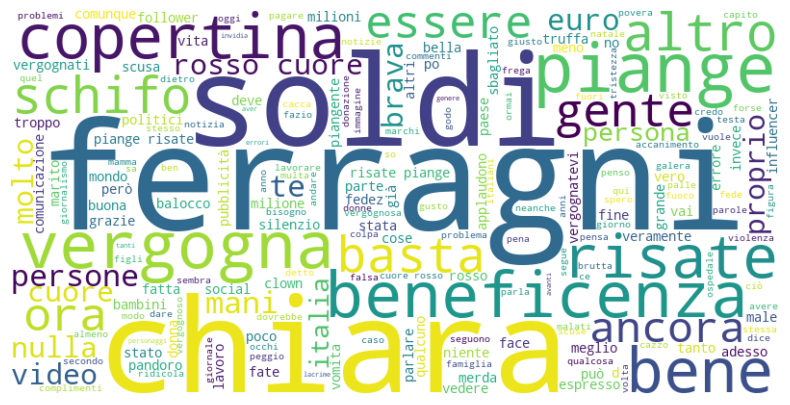

In [45]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

#important to set our stopwdords
stopwords = set(['fa', 'solo', 'fatto', 'fare', 'UNK', 'unk','[UNK].', 'va', 'sempre','poi','é','mai','davvero','me', 'cosa','dire', 'due'])
all_words = [word for sublist in df['Keywords'] for word in sublist if word not in stopwords]

text = ' '.join(all_words)

wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stopwords, max_words=200).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


## Topic Modeling

In [5]:
df=pd.read_csv("df_with_keywords.csv")

In [4]:
#Importing dependencies
from bertopic import BERTopic
import stanza


2024-05-03 17:39:29.840833: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [49]:
#Download and initialize Stanza pipeline for Italian language
#Tasks: tokenization, multi-word token expansion, and lemmatization processors
stanza.download('it')
nlp = stanza.Pipeline(lang='it', processors='tokenize,mwt,lemma')

2024-05-02 21:00:20 INFO: Downloaded file to /Users/simone/stanza_resources/resources.json
2024-05-02 21:00:20 INFO: Downloading default packages for language: it (Italian) ...
2024-05-02 21:00:25 INFO: File exists: /Users/simone/stanza_resources/it/default.zip
2024-05-02 21:00:30 INFO: Finished downloading models and saved to /Users/simone/stanza_resources
2024-05-02 21:00:30 INFO: Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


2024-05-02 21:00:30 INFO: Downloaded file to /Users/simone/stanza_resources/resources.json
2024-05-02 21:00:30 INFO: Loading these models for language: it (Italian):
| Processor | Package           |
---------------------------------
| tokenize  | combined          |
| mwt       | combined          |
| lemma     | combined_nocharlm |

2024-05-02 21:00:30 INFO: Using device: cpu
2024-05-02 21:00:30 INFO: Loading: tokenize
2024-05-02 21:00:30 INFO: Loading: mwt
2024-05-02 21:00:30 INFO: Loading: lemma
2024-05-02 21:00:30 INFO: Done loading processors!


In [15]:
#Removing stopwords from the text
text_without_stopwords = [' '.join([word for word in text.split() if word not in italian_stopwords]) for text in df["Text"]]
df.insert(5, "Text without stopwords", text_without_stopwords)

In [50]:
#Thanks to Stanza, lemmatizing the text without stopwords
text_lemmatized_no_stpw = [
    ' '.join([word.lemma for sent in nlp(' '.join([word for word in text.split() if word not in italian_stopwords])).sentences for word in sent.words])
    for text in df["Text"]]

df.insert(6, "Lemmatized text without stopwords", text_lemmatized_no_stpw)

In [16]:
display(df.sample(5, random_state=50))

,Source,Username,Language,Raw Text,Text,Text without stopwords,Lemmatized text without stopwords,Title,Date,URL,Likes,Keywords
11508,Instagram,_._blackrose___,it,👏👏.,emoji mani che applaudono emoji mani che appla...,mani applaudono mani applaudono.,mano applaudire mano applaudire .,larepubblicaVerificatoSanzione di oltre 1 mili...,2023-12-20,NaN,0.0,['applaudono.']
5023,Facebook,Jeannine Passi,it,Belli e adorable.,belli e adorable.,belli adorable.,bello adorable .,Chiara Ferragni si scusa.,2024-03-10,NaN,0.0,[]
38295,Youtube,silvial.9232,it,Aggiornamento del 13 febbraio:\n- balocco impu...,aggiornamento del 13 febbraio balocco impugna ...,aggiornamento 13 febbraio balocco impugna prov...,aggiornamento 13 febbraio balocco impugna prov...,LO SCHEMA FERRAGNI.\n IL RITORNO DI CHIARA FER...,2024-04-06,NaN,0.0,"['andata', 'gestione', 'essere', 'me', 'molto'..."
16889,Instagram,ebony_and_irony.2001,it,Io lo trovo un vero e proprio insulto a Joker 😡.,io lo trovo un vero e proprio insulto a joker ...,trovo vero proprio insulto joker infuriata.,trovare vero proprio insulto joker infuriata .,corriereVerificato(✏️ Maria Volpe) Non è decis...,2024-03-31,NaN,0.0,"['joker', 'insulto']"
26392,Instagram,pisani350,it,"L'avrebbe comunque fatto, se non scoperta?.",l avrebbe comunque fatto se non scoperta .,comunque fatto scoperta,comunque fare scoperta,ilsole_24oreVerificato«Sono sempre stata convi...,2023-12-20,NaN,0.0,"['comunque', 'fatto']"


### Tried to conduct Topic Modeling on Lemmatized Text Without Stopwords, but the model's performance fell short

Despite our efforts, the topical modeling conducted on the lemmatized text without stopwords yielded unsatisfactory results. However, we have retained the lemmatized text within the dataset for potential future applications.

```
df_topic_modeling=df[df['Lemmatized text without stopwords'].notnull()]
model = BERTopic()
topics, probabilities = model.fit_transform(df_topic_modeling['Lemmatized text without stopwords'])
topic_info=model.get_topic_info()
display(topic_info)  
```

In [259]:
df=pd.read_csv("df_lemma_txt.csv")

In [260]:
df_topic_modeling=df[df["Text without stopwords"].notnull()]

In [41]:
#BERTopic
model = BERTopic()
topics, probabilities = model.fit_transform(df_topic_modeling["Text without stopwords"])

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [261]:
df_topic_modeling["Topic"]=topics

In [42]:
topic_info=model.get_topic_info()
display(topic_info)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13096,-1_ferragni_solo_fare_persone,"[ferragni, solo, fare, persone, altro, cosa, p...",[me frega accidenti ferragni vita chiedo perso...
1,0,688,0_italia_the_of_and,"[italia, the, of, and, is, to, milan, italiani...",[Tuttavia detrattori Milano affermano città fr...
2,1,653,1_fatto_fatta_fatti_fatte,"[fatto, fatta, fatti, fatte, figura, errore, b...","[fatto cuore, cosa fatto, cosa fatto]"
3,2,652,2_video_scuse_studiato_aspettavo,"[video, scuse, studiato, aspettavo, grazie, cr...",[grazie video cristiano brutta storia adesso s...
4,3,599,3_politici_governo_politica_politico,"[politici, governo, politica, politico, rubano...","[politici già scritto, politici beneficenza so..."
...,...,...,...,...,...
574,573,10,573_arte_amorali_squallor_melle,"[arte, amorali, squallor, melle, pvmitalia, ri...",[premio nobel sceneggiata napoletana davvero b...
575,574,10,574_zitta_meglio_verrgognati_sarebba,"[zitta, meglio, verrgognati, sarebba, zotica, ...","[meglio zitta trucco qualunque, zitta meglio f..."
576,575,10,575_mediatica_gogna_fiction_goudicate,"[mediatica, gogna, fiction, goudicate, lob, to...",[copertina vergognosa deve pagare paghi gogna ...
577,576,10,576_tutina_frode_delegato_amministratore,"[tutina, frode, delegato, amministratore, mark...",[expedit twitter esatto moralismo tot kg seguo...


In [43]:
#Topic ID with keywords and Relevance score
topics_data = []

for index, row in topic_info.iterrows():
    topic_number = row['Topic']
    topic_words = model.get_topic(topic_number)
    #Append topic number and corresponding keywords to the list as a dictionary
    topics_data.append({'Topic': topic_number, 'Keywords': topic_words})
    print(f"Topic {topic_number}: {topic_words}")

topics_df = pd.DataFrame(topics_data)

#topics_df.to_csv('generated_topics.csv', index=False) --already saved


Topic -1: [('ferragni', 0.0016776174814521906), ('solo', 0.001660591290420741), ('fare', 0.0016540148354247902), ('persone', 0.0016180915499515072), ('altro', 0.0016167657097496241), ('cosa', 0.0016152034191269766), ('poi', 0.0015778277166526944), ('euro', 0.0015766809746194264), ('gente', 0.001568785197182408), ('fatto', 0.0015541875576040806)]
Topic 0: [('italia', 0.02012636154425161), ('the', 0.018843046128643428), ('of', 0.013361730466006966), ('and', 0.013027752234439917), ('is', 0.011398501603085623), ('to', 0.009762128063332088), ('milan', 0.009460709154931956), ('italiani', 0.008363140801609657), ('are', 0.008268555976824127), ('city', 0.007549551109274202)]
Topic 1: [('fatto', 0.01893413809897242), ('fatta', 0.007889677983026927), ('fatti', 0.00616223305868334), ('fatte', 0.0048321353856379656), ('figura', 0.004728087743376394), ('errore', 0.00392478714509488), ('beneficenza', 0.003823721091005238), ('fatica', 0.003488586165950247), ('bene', 0.0034821463792051493), ('cosa', 0.

In [44]:
model.visualize_topics()

In [47]:
#Function that displays topic based on a query which we'll ask next
def display_top_topics(query, n=10):
    topics = model.find_topics(str(query), top_n=n)
    print(f"\n\"{query}\" Related Topic:")
    for topic in topics:
        print(f"{model.get_topic(topic[0])}")

In [48]:
#Most important keywords from keywords extraction
queries = ["chiara", "ferragni", "beneficenza", "vergogna", "soldi", "truffa"]
for query in queries:
    display_top_topics(query)


"chiara" Related Topic:
[('chiaraferragni', 0.10408591496792084), ('chissenefrega', 0.043260833601031896), ('chiaretta', 0.040443881093345256), ('chiss', 0.037326774374088593), ('chiara', 0.02832491867921236), ('chianci', 0.026057947163280172), ('carnagione', 0.022180865479202123), ('pestato', 0.021441085041942174), ('chiama', 0.019049609077490988), ('servita', 0.01703892369939632)]
False

"ferragni" Related Topic:
[('nuie', 0.14107233464258576), ('su', 0.1285638877206927), ('vieni', 0.07877417165432506), ('haaaaaahhhhhhh', 0.07849094335220327), ('nondichiara', 0.07849094335220327), ('ferragniout', 0.07849094335220327), ('catttt', 0.07849094335220327), ('sfrand', 0.07849094335220327), ('ferrra', 0.07849094335220327), ('eeebbbrava', 0.07849094335220327)]
False

"beneficenza" Related Topic:
[('beneficenza', 0.04209157378538203), ('silenzio', 0.028802528986288368), ('fa', 0.012383064621344756), ('vera', 0.008973480263149229), ('beneficienza', 0.007899999264622157), ('venti', 0.0072978035

In [262]:
#Creation of a list of topics not related to the case of study, done manually
unrelated_topics=[15, 43, 47, 125, 130, 290, 334, 352, 443, 489]

In [263]:
df = pd.merge(df, df_topic_modeling[['Source','Username', 'Date', 'Text', 'Topic']], on=['Source','Username', 'Date', 'Text'], how='left')
df.fillna(-1, inplace=True) #Replace NaN values with most common topic

In [264]:
df= df[~df['Topic'].isin(unrelated_topics)]
df.reset_index(drop=True, inplace=True)

## Entity Recognition

In [267]:
df=pd.read_csv("df_case-related_topics.csv")

In [8]:
#Importing dependencies
from transformers import BertTokenizerFast, BertForTokenClassification, pipeline

2024-05-04 13:35:18.251789: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [255]:
#Initializa tokenizer and model
#The model is for token classification, it uses a pre-trained Italian BERT model fine-tuned for NER
tokenizer = BertTokenizerFast.from_pretrained("nickprock/bert-italian-finetuned-ner")
model = BertForTokenClassification.from_pretrained("nickprock/bert-italian-finetuned-ner")

In [256]:
#Now, we can initialize the Name Entity Recognition
ner_pipeline = pipeline("ner", model = model, tokenizer = tokenizer, aggregation_strategy="simple")

In [257]:
#Function to perform NER
def ner(text):
    segments = split_text_into_segments(text) #to accomodate limits
    all_entities = []
    for segment in segments:
        entities = ner_pipeline(segment)
        all_entities.extend(entities)
    return all_entities

### Named Entity Recognition (NER) is performed without removing stopwords as their removal could potentially compromise its performance.

In [270]:
df["NER"]=df["Text"].apply(ner) 

Token indices sequence length is longer than the specified maximum sequence length for this model (688 > 512). Running this sequence through the model will result in indexing errors


In [14]:
display(df.sample(5))

,Source,Username,Language,Raw Text,Text,Text without stopwords,Lemmatized text without stopwords,Title,Date,URL,Likes,Keywords,Topic,NER
5456,Facebook,Loretta Di Placido,it,"Il video postato è imbarazzante, inopportuno e...",il video postato è imbarazzante inopportuno e ...,video postato imbarazzante inopportuno rende s...,video postare imbarazzante inopportuno rendere...,Chiara Ferragni si scusa.,2024-02-25,https://www.facebook.com/loretta.placido?comme...,0.0,"['meritarci', 'fatto', 'pezza']",2.0,[]
22298,Instagram,m18g,it,Fazio : il solito cane da guardia della democr...,fazio il solito cane da guardia della democraz...,fazio solito cane guardia democrazia domande s...,fazio solito cane guardia democrazia domanda <...,agenzia_ansaVerificatoIl sito streaming del No...,2024-02-03,-1,0.0,"['me', 'scomodissime']",3.0,[]
12032,Instagram,addoloratadapice,it,È anche un ottima attrice.,è anche un ottima attrice.,ottima attrice.,ottimo attore .,fanpage.itVerificato#ChiaraFerragni si scusa p...,2023-12-20,-1,0.0,['attrice.'],260.0,[]
11035,Facebook,romano6706,it,Non l'ho mai invidiata ma credo se ne parli tr...,non l ho mai invidiata ma credo se ne parli tr...,mai invidiata credo parli troppo risponderà se...,mai invidiata credere parlare troppo risponder...,La copertina del numero de L’Espresso dell’8 m...,2024-03-17,-1,0.0,"['soprattutto', 'dovuto', 'opportune', 'media.']",79.0,[]
37560,Youtube,rossellacosentini7382,it,Probabilmente dio e Gesù non perdoneranno ma...,probabilmente dio e gesù non perdoneranno mai ...,probabilmente dio gesù perdoneranno mai chiara...,probabilmente dio gesù perdoneranno mai chiaro...,Chiara Ferragni e Balocco: la verità sul pando...,2024-01-10,-1,0.0,"['vanta', 'solo', 'bambini', 'perdoneranno']",55.0,"[{'entity_group': 'PER', 'score': 0.68821156, ..."


In [10]:
print(len(df["NER"]))
a=0
for i in df["NER"]:
    if i!="[]":
        a+=1
print(a)

38378
5451


The suboptimal performance of the BERT-IT NER model can be attributed to intrinsic factors such as:

- Input text quality: The quality of the input text can significantly influence the model's performance. If the text contains many abbreviations, spelling errors, unclear sentences, or automatically generated text, the model may struggle to correctly recognize entities.

- Text length: The length of the text can affect the model's performance. If the text is too short or too long, it might be challenging for the model to accurately detect entities, especially if there are many padding tokens [PAD] in the BERT model.

- Linguistic variations: Although the model is trained on Italian, it may not cover all linguistic variations or dialects. If the text contains words or phrases in regional dialects or specialized languages, the model may not be able to recognize them as entities.

- Pre-trained NER model: The BERT model used may not have been trained on a representative dataset of all types of input text. If the text presents a domain-specific or context not covered by the model's training, it may struggle to correctly recognize entities.

# CONTEXT SENSITIVE SENTIMENT ANALYSIS

### The osiria/bert-tweet-italian-uncased-sentiment model already considers context in its predictions because it is based on a version of BERT, which is sensitive to the contextual meaning of words in the text.

In [118]:
df=pd.read_csv('df_with_NER.csv')
topics=pd.read_csv('generated_topics.csv')

In [119]:
#Importing dependencies
from transformers import BertTokenizerFast, BertForSequenceClassification, pipeline
import torch

In [120]:
def trasforma_keywords(keywords):
    cleaned_keywords = keywords.replace("[", "").replace("]", "").replace("'", "")
    
    words_with_scores = [word.strip("()").split(", ") for word in cleaned_keywords.split("), (")]
    
    words_only = [pair[0] for pair in words_with_scores]
    
    transformed_keywords = ' '.join(words_only)
    
    return transformed_keywords

In [121]:
topics["Keywords"]=topics["Keywords"].apply(trasforma_keywords)

In [122]:
#Initialize tokenizer and model
tokenizer = BertTokenizerFast.from_pretrained("osiria/bert-tweet-italian-uncased-sentiment")
model = BertForSequenceClassification.from_pretrained("osiria/bert-tweet-italian-uncased-sentiment")
classifier = pipeline("text-classification", model=model, tokenizer=tokenizer)

In [123]:
#Finally, the function to predict the sentiment
def predict_sentiment_topic(topic):
    inputs = tokenizer(topic, return_tensors="pt", truncation=True, padding=True, max_length=512) #always for the input limit

    #Prediction!
    with torch.no_grad():
        outputs = model(**inputs)

    #Probability
    predictions = torch.nn.functional.softmax(outputs.logits, dim=-1)
    class_names = ['negative', 'positive']
    predicted_class = class_names[predictions.argmax()]

    return predicted_class

In [124]:
topics["Topic Sentiment"]=topics["Keywords"].apply(predict_sentiment_topic)

In [125]:
df = pd.merge(df, topics[['Topic', 'Topic Sentiment']], on=['Topic'], how='left')

In [126]:
#This function is used to 
def predict_sentiment_with_context(text, title, topic_sentiment):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    predictions = torch.nn.functional.softmax(outputs.logits, dim=-1)
    class_names = ['negative', 'positive']
    predicted_class = class_names[predictions.argmax()]
    probabilities = predictions.numpy().flatten()
    probability_dict = {class_names[i]: probabilities[i] for i in range(len(class_names))}


    #This part is to specify the context in which we are
    if any(word in title.lower() for word in ['scusa', 'chiede scusa', 'chiede perdono', 'perdono']):
        context = 'neutral or positive'
    elif any(negative_word in title.lower() for negative_word in ['scandalo', 'truffa', 'condanna', 'espresso', 'cesso', 'brutta', 'oscuro', 'multa', 'multata', 'maximulta']):
        context = 'negative'
    else:
        context = 'neutral or positive'

    #Setting the rules to better define the logic fo the sentiment analysis context-based
    if topic_sentiment == 'positive' and predicted_class == 'positive':
        if context == 'negative':
            predicted_class = 'negative'
    return predicted_class, probability_dict

In [127]:
#just an example
predict_sentiment_with_context("Godo", "Chiara Ferragni multata chiede scusa", "positive")

('positive', {'negative': 0.05390344, 'positive': 0.9460966})

In [128]:
df['Sentiment'] = df.apply(lambda row: predict_sentiment_with_context(row['Text'], row['Title'], row['Topic Sentiment']), axis=1)

In [129]:
display(df.sample(50))

,Source,Username,Language,Raw Text,Text,Text without stopwords,Lemmatized text without stopwords,Title,Date,URL,Likes,Keywords,Topic,NER,Topic Sentiment,Sentiment
15018,Instagram,chiara_toda,it,Siete schifosi! Pagliacci voi!!!.,siete schifosi pagliacci voi .,schifosi pagliacci,schifosi pagliaccio,"🔴 FERRAGNI SPA, IL LATO OSCURO DI CHIARA Una r...",2024-03-10,-1,0.0,"['voi.', 'pagliacci']",-1.0,[],negative,"(negative, {'negative': 0.9982838, 'positive':..."
33872,Youtube,Nuflex09,it,29:40 Marra che legge il futuro ahaha.,29 40 marra che legge il futuro ahaha.,29 40 marra legge futuro ahaha.,29 40 marra legge futuro ahaha .,La Pubblicità Fuorviante del PANDORO di Chiara...,2024-01-10,-1,0.0,"['ahaha.', 'legge', 'marra']",148.0,"[{'entity_group': 'MISC', 'score': 0.89982384,...",negative,"(positive, {'negative': 0.08753062, 'positive'..."
8347,Facebook,Rita Palazzo,it,Forza Chiara..a tutti capita di sbagliare io h...,forza chiara a tutti capita di sbagliare io ho...,forza chiara capita sbagliare sempre creduto b...,forza chiaro capitare sbagliare sempre credere...,Chiara Ferragni si scusa.,2024-02-25,https://www.facebook.com/profile.php?id=100004...,0.0,"['famiglia', 'chiara', 'salute', 'fede']",-1.0,[],negative,"(positive, {'negative': 0.024641024, 'positive..."
2574,Facebook,Dodauto Arl,it,Sparisci......\n Si si impugna....tu non ha sb...,sparisci .\n si si impugna tu non ha sbagliato...,sparisci impugna sbagliato comunicazione para ...,<SOS>sparisce impugna sbagliare comunicazione ...,Chiara Ferragni si scusa.,2024-02-04,https://www.facebook.com/dodauto.plurimarche?c...,0.0,['finte'],50.0,[],negative,"(negative, {'negative': 0.9989385, 'positive':..."
6596,Facebook,Marta Borghese,it,Pezzi di merda.,pezzi di merda.,pezzi merda.,pezzo merda .,Chiara Ferragni si scusa.,2023-12-24,https://www.facebook.com/marta.borghese.96?com...,0.0,"['merda.', 'pezzi']",143.0,[],negative,"(negative, {'negative': 0.99774855, 'positive'..."
19750,Instagram,grazia4844,it,👏👏👏brava ecco quando si dice che i soldi danno...,emoji mani che applaudono emoji mani che appla...,mani applaudono mani applaudono mani applaudon...,mano applaudire mano applaudire mano applaudir...,larepubblicaVerificatol'ipotesi di truffa aggr...,2024-01-24,-1,0.0,"['applaudono', 'brava', 'mani', 'ecco']",137.0,[],positive,"(negative, {'negative': 0.9939989, 'positive':..."
17940,Instagram,filippi.alessandrade,sw,Buffona.,buffona.,buffona.,buffo uno .,fanpage.itVerificato#ChiaraFerragni si scusa p...,2023-12-20,-1,0.0,['buffona.'],225.0,[],negative,"(negative, {'negative': 0.99760133, 'positive'..."
21220,Instagram,laura_mattavelli,it,"Dillo alla mamma, dillo all'avvocato 😂.",dillo alla mamma dillo all avvocato faccina ch...,dillo mamma dillo avvocato piange risate.,dillo mamma di lo avvocato piangere risata .,"🔴 FERRAGNI SPA, IL LATO OSCURO DI CHIARA Una r...",2024-03-10,-1,0.0,"['avvocato', 'mamma']",361.0,[],negative,"(negative, {'negative': 0.9176318, 'positive':..."
7742,Facebook,Paolo Altamura,it,Sembra una recita di Natale...e si fa pubblici...,sembra una recita di natale e si fa pubblicità...,sembra recita natale fa pubblicità stessa,sembrare recitare natale fare pubblicità stesso,Chiara Ferragni si scusa.,2023-12-24,-1,0.0,"['pubblicità', 'fa', 'stessa.']",4.0,[],negative,"(negative, {'negative': 0.9961132, 'positive':..."
34983,Youtube,cristinalazzereschi3549,it,Spero che si faccia giustizia !.,spero che si faccia giustizia .,spero giustizia,sperare giustizia,"LA FINE DI CHIARA FERRAGNI? IL PANDORO, LE UOV...",2024-01-05,-1,0.0,['giustizia.'],139.0,[],negative,"(positive, {'negative': 0.041519713, 'positive..."


## Study of sentiments

In [131]:
df=pd.read_csv('df_with_sentiment.csv')

In [ ]:
#Group data by 'Source' and 'Sentiment', and count the number of posts
sentiment_by_source = df.groupby('Source')['Sentiment'].value_counts().unstack()

#Plotting the results
plt.figure(figsize=(14, 7))
sentiment_by_source.plot(kind='bar', stacked=True)
plt.title('Sentiment by Source')
plt.xlabel('Source')
plt.ylabel('Number of Comments')
plt.xticks(rotation=45)
plt.legend(title='Sentiment')
plt.show()


In [134]:
#Change sentiment labels
df['Sentiment 2'] = df['Sentiment'].replace({'positive': 'with Chiara Ferragni', 'negative': 'against Chiara Ferragni'})

#Group data by 'Source' and 'Sentiment', and count the number of posts
sentiment_by_source= df[df["Date"]>="2024-03-10"].groupby('Source')['Sentiment 2'].value_counts().unstack()

plt.figure(figsize=(14, 7))
sentiment_by_source.plot(kind='bar', stacked=True)
plt.title("Sentiment after Espresso, Ferragni S.p.a.")
plt.xlabel('Social Media')
plt.ylabel('Number of Comments')
plt.xticks(rotation=45)
plt.legend(title='Sentiment')
plt.show()

<Figure size 1400x700 with 0 Axes>

/Users/simone/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


ValueError: Image size of 598x140950 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 640x480 with 1 Axes>